# Temperature evaluation (sfc) for nextGEMS cycle 3

contributed by Sebastian Milinski (sebastian.milinski@ecmwf.int), based on [STARTHERE_IFS.ipynb](./STARTHERE_IFS.ipynb)

- Includes basic metrics for near-surface air temperature
- global mean and regional
- reference datasets: ERA5

Use the kernel Python 3 (based on the module python3/unstable)

If you get an error with `import gribscan` below, run the following in a cell, then restart the kernel:
`%pip install gribscan`


In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import matplotlib.cm as cm
import cmocean.cm as cmo
from scipy.interpolate import CloughTocher2DInterpolator, LinearNDInterpolator, NearestNDInterpolator
import gribscan
import intake
# Import Cdo-py
import cdo
cdo = cdo.Cdo(tempdir='/scratch/m/m300265/tmp/cdo-py') #change the tempdir to your scratch

import cartopy.crs as ccrs
import calendar # convert month numbers into month name strings with calendar.month_name[1] => 'January'
# all-caps month abbr: calendar.month_abbr[1].upper() => 'JAN'
import os

plotdir = './plots/temperature/'
if not os.path.exists(plotdir):
    os.makedirs(plotdir)


ERROR 1: PROJ: proj_create_from_database: Open of /sw/spack-levante/mambaforge-23.1.0-1-Linux-x86_64-3boc6i/share/proj failed


In [2]:
def attach_coords(ds):
    model_lon = ds.lon.values
    model_lat = ds.lat.values
    return ds.assign_coords(
        lat = (("value",), model_lat, {"units": "degree_north"}),
        lon = (("value",), model_lon, {"units": "degree_east"}),
    )

In [3]:
def convert_to_xarray(ds,var,grid='025'):
    # select a variable, reshape lat lon and convert to XArray DataArray
    # needs to specify an existing varname e.g. '2t'
    # assumes that ds has the shape time | value
    
    # arrange value coordinate into lat/lon
    sample = np.reshape(ds[var].values, newshape=(len(ds.time),len(np.unique(ds.lat)),len(np.unique(ds.lon))))
    
    # create DataArray with proper name, dimensions, and coordinates
    da = xr.DataArray(
        data=sample,
        name=var,
        dims=["time", "lat", "lon"],
        coords=dict(
            time=ds.time.data,
            lon=(["lon"], np.unique(ds.lon)),
            # lat=(["lat"], np.unique(ds.lat)),
            lat=(["lat"], np.unique(ds.lat)[::-1]), # use this because otherwise lats are flipped; only comment for testing
        ),
        attrs=dict(
            # variable=var,
        ),
    )
    
    # attach griddes so that cdo interprets it as a regular lonlat grid:
    if grid=='025':
        my_griddes = '/work/bm1235/ifs-grids/multio_grids_cdoPython/025_griddes'
    elif grid=='1':
        my_griddes = '/work/bm1235/ifs-grids/multio_grids_cdoPython/1_griddes'
    else:
        raise Exception("Unsupported grid. Maybe new grid introduced in multIO?")
        
    da = cdo.setgrid(my_griddes, input=da.to_dataset(), returnXDataset=True)[var]
    
    return da

## load model output
Open catalog:

### IFS

In [4]:
cat = intake.open_catalog("https://data.nextgems-h2020.eu/catalog.yaml")

In [5]:
# which IFS experiments are available? Which streams are in the IFS catalog for experiment 'tco2559-ng5-cycle3'?
print(list(cat.IFS))
print(list(cat.IFS['IFS_4.4-FESOM_5-cycle3'])) 

['IFS_4.4-FESOM_5-cycle3', 'IFS_9-FESOM_5-cycle3', 'IFS_9-NEMO_25-cycle3', 'IFS_28-NEMO_25-cycle3', 'IFS_28-FESOM_25-cycle3', 'IFS_4.4-FESOM_5-cycle3-fastdata', 'IFS_grids']
['2D_1h_native', '3D_1h6h_native', '2D_monthly_native', '3D_monthly_native', '2D_monthly_0.25deg', '3D_monthly_0.25deg', '2D_1h_0.25deg', '3D_1h6h_0.25deg', '2D_monthly_1deg', '3D_monthly_1deg', '2D_1h_1deg', '3D_1h6h_1deg', 'WAM_1h_native']


TOA and surface fields are in the 2D output. We load the 0.25 deg because we don't need higher resolution for comparing to observations.

In [6]:
ds = cat.IFS['IFS_4.4-FESOM_5-cycle3']['2D_monthly_1deg'].to_dask()
ds_9km = cat.IFS['IFS_9-NEMO_25-cycle3']['2D_monthly_1deg'].to_dask()
ds_9km_f = cat.IFS['IFS_9-FESOM_5-cycle3']['2D_monthly_1deg'].to_dask()
ds_28km = cat.IFS['IFS_28-NEMO_25-cycle3']['2D_monthly_1deg'].to_dask()
ds_28km_f = cat.IFS['IFS_28-FESOM_25-cycle3']['2D_monthly_1deg'].to_dask()

In [7]:
# get ttr, tsr, 2t and reshape to (#lat x #lon) numpy array
ifs_4km_2t = convert_to_xarray(ds,var='2t',grid='1')


In [8]:
# same for 9km
# get ttr, tsr, 2t and reshape to (#lat x #lon) numpy array
ifs_9km_2t = convert_to_xarray(ds_9km,var='2t',grid='1')


In [9]:
# same for 9km FESOM
# get ttr, tsr, 2t and reshape to (#lat x #lon) numpy array
ifs_9km_f_2t = convert_to_xarray(ds_9km_f,var='2t',grid='1')


In [10]:
# same for 28km
# get ttr, tsr, 2t and reshape to (#lat x #lon) numpy array
ifs_28km_2t = convert_to_xarray(ds_28km,var='2t',grid='1')


In [11]:
# same for 28km FESOM
# get ttr, tsr, 2t and reshape to (#lat x #lon) numpy array
ifs_28km_f_2t = convert_to_xarray(ds_28km_f,var='2t',grid='1')


---

## load reference datasets

### ERA5
from file, not catalogue because monthly means are not available in catalog anymore?!

In [12]:
ifile = '/work/bb1153/m300265/NextGEMS/observations/ERA5_temp2_mm_2000-2022.nc'
ifile_gm = '/work/bb1153/m300265/NextGEMS/observations/ERA5_temp2_mm_2000-2022_gm.nc' # used cdo fldmean to compute area-weighted global mean

era5 = xr.open_dataset(ifile)['2t']
era5_gm = xr.open_dataset(ifile_gm)['2t']
# move time stamps to middle of the month (same convention used for model output)
era5['time'] = era5.time+np.timedelta64(15, 'D')
era5_gm['time'] = era5_gm.time+np.timedelta64(15, 'D')

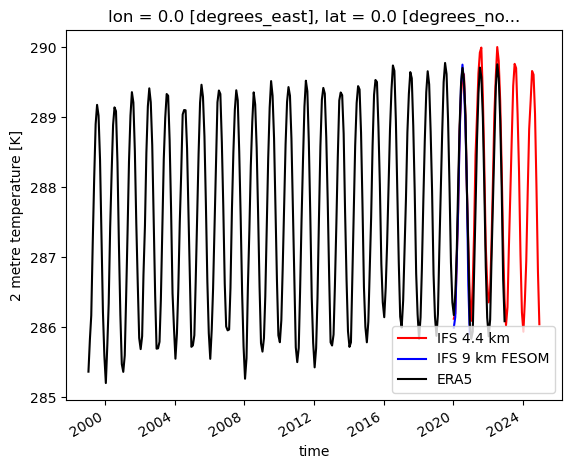

In [13]:
# quick plot, also adding some model simulations

# compute global mean 2t and plot time series:
cdo.fldmean(input=ifs_4km_2t.to_dataset(), returnXDataset=True)['2t'].plot(color='red',label='IFS 4.4 km')
cdo.fldmean(input=ifs_9km_f_2t.to_dataset(), returnXDataset=True)['2t'].plot(color='blue',label='IFS 9 km FESOM')


era5_gm.plot(color='black',label='ERA5')
# plt.xlim([pd.to_datetime('2020-01-15'),pd.to_datetime('2024-12-15')]) # use this to limit x-axis to model simulations

plt.legend()

---
## plotting
### global mean time series

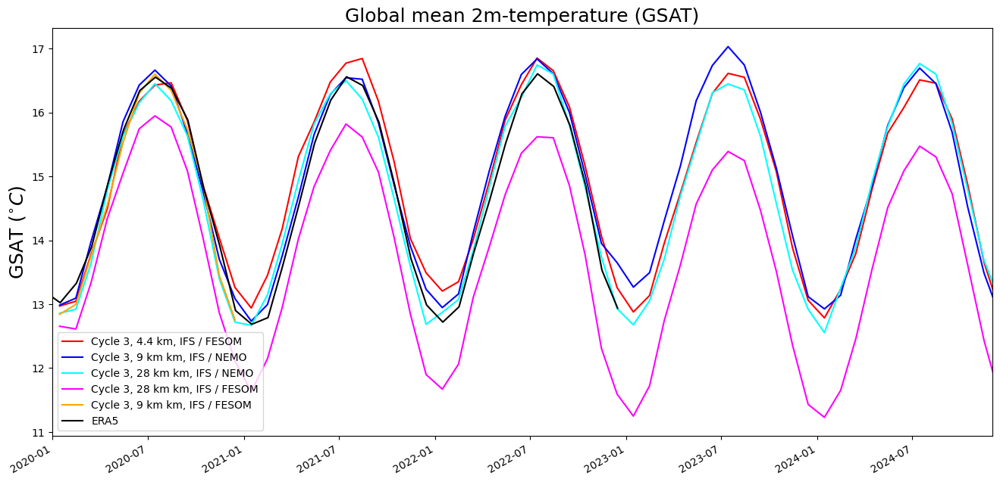

In [14]:
linecolors = ['red',
              'blue',
              'cyan',
              # 'green',
              'magenta',
              'orange',
             ]
linelabels = ['Cycle 3, 4.4 km, IFS / FESOM',
              'Cycle 3, 9 km km, IFS / NEMO',
              'Cycle 3, 28 km km, IFS / NEMO',
              # 'Cycle 3, 5 km, ICON',
              'Cycle 3, 28 km km, IFS / FESOM',
              'Cycle 3, 9 km km, IFS / FESOM',
             ]
models = [ifs_4km_2t.squeeze(),
          ifs_9km_2t.squeeze(),
          ifs_28km_2t.squeeze(),
          # icon_5km_2t.squeeze(),
          ifs_28km_f_2t.squeeze(),
          ifs_9km_f_2t.squeeze(),
         ]

plt.figure(figsize=(16,7))
for i, model in enumerate(models):
    model_gm = cdo.fldmean(input=model.to_dataset(), returnXDataset=True)['2t'].squeeze()
    (model_gm-273.15).plot(color=linecolors[i],label=linelabels[i])

# add ERA5
(era5_gm-273.15).plot(color='black',label='ERA5')
                          

plt.xlim([pd.to_datetime('2020-01'),pd.to_datetime('2024-12')])
plt.title('Global mean 2m-temperature (GSAT)',fontsize=18)
plt.ylabel('GSAT ($^{\circ}C$)',fontsize=18)
plt.xlabel('')
plt.legend()
plt.savefig(plotdir+'GSAT.png',dpi=300)

### maps

In [15]:
# stippled areas are biases that do not exceed interannual variability (i.e. probably not significant)

def plot_bias(data,iax,title,plotlevels,lower,upper,index):
    plot = data.plot(ax=iax,
              transform=ccrs.PlateCarree(),
              colors='RdBu_r',
              linewidths=0.3,
              levels=plotlevels,
              add_colorbar=False,
                     )
    stipple_data = data.where(np.logical_and(data>lower.isel(month=index), data<upper.isel(month=index)))/data.where(np.logical_and(data>lower.isel(month=index), data<upper.isel(month=index)))
    plot2 = stipple_data.plot.contourf(ax=iax,levels=[-10,0,10], hatches=["","...."],add_colorbar=False, alpha=0, transform=ccrs.PlateCarree())


    iax.set_title(title,fontsize=small_fonts)
    # iax.set_title(data.label+' ('+str(len(data.ensemble))+')',fontsize=small_fonts)

    return plot

def plot_maps(model, var, ref_data, model_label,year='2020'):
    model = model.sel(time=year)
        
    if year == '2020':
        panel_1_off = True
    else:
        panel_1_off = False

    # what to use for significance testing
    # everything between these values will be considered not significant and hatched in the plot
    lower = range_min#.rename({'time': 'month'})
    upper = range_max#.rename({'time': 'month'})


    fig, ax = plt.subplots(3, 4,figsize=(24,10), subplot_kw={'projection': ccrs.Robinson(central_longitude=180, globe=None)})
    plotlevels=np.arange(-5,5.01,0.25)
    global small_fonts
    small_fonts = 12
    # plt.figure(figsize=(8,4))
    # axes = plt.axes(projection=ccrs.PlateCarree())
    axes = ax.flatten()


    for index in range( len(model.time) ): # some experiments have less than 12 months, draw fewer panels for those
            plot = plot_bias(model.sel(time=year).isel(time=index)-ref_data.isel(month=index)
                             ,iax=axes[index],title=calendar.month_name[index+1],plotlevels=plotlevels
                             ,lower=lower,upper=upper,index=index)

    for axi in axes:
        axi.coastlines(color='brown',linewidth=0.4)

    if panel_1_off:
        axes[0].remove()


    # plt.tight_layout()
    # common colorbar
    fig.subplots_adjust(right=0.95)
    cbar_ax = fig.add_axes([0.96, 0.3, 0.02, 0.4]) # [left, bottom, width, height]
    cbar = fig.colorbar(plot, cax=cbar_ax)
    cbar.ax.tick_params(labelsize=small_fonts)
    cbar.set_label('K', labelpad=-32, y=-.08, rotation=0)

    plt.suptitle('2t bias IFS ' + model_label + ' ' + year + '\nrel. to ERA5 climatology',fontsize=small_fonts*2)
    # plt.tight_layout()
    plt.savefig(plotdir+'2t_bias_'+year+'_'+model_label+'.png',dpi=300)
    plt.show()

In [16]:
# interpolate era5 to 1x1 grid
era5_r360x180 = cdo.remapcon('r360x180',input=era5.to_dataset(),returnXDataset=True)['2t']
era5_r360x180

<xarray.DataArray '2t' (time: 288, lat: 180, lon: 360)>
[18662400 values with dtype=float32]
Coordinates:
  * time     (time) datetime64[ns] 1999-01-16 1999-02-16 ... 2022-12-16
  * lon      (lon) float64 0.0 1.0 2.0 3.0 4.0 ... 355.0 356.0 357.0 358.0 359.0
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
Attributes:
    long_name:  2 metre temperature
    units:      K
    code:       167
    table:      128

In [17]:
era5_r360x180_ref_clim = era5_r360x180.sel(time=slice('2017','2021')).groupby('time.month').mean()
era5_r360x180_spread = (era5_r360x180.groupby('time.month') - era5_r360x180_ref_clim).sel(time=slice('2017','2021'))

In [18]:
# quantiles are a bit more conservative than the range, but interpolation from 5 values might not be robust
# q05 = era5_spread.groupby('time.month').quantile(0.05)
# q95 = era5_spread.groupby('time.month').quantile(0.95)
# min-max range is more conservative, but could be quite extreme
range_min = era5_r360x180_spread.groupby('time.month').min()
range_max = era5_r360x180_spread.groupby('time.month').max()

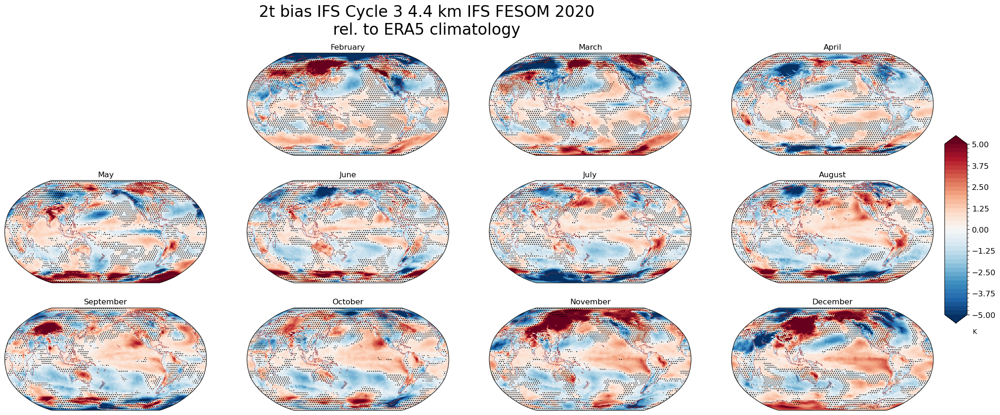

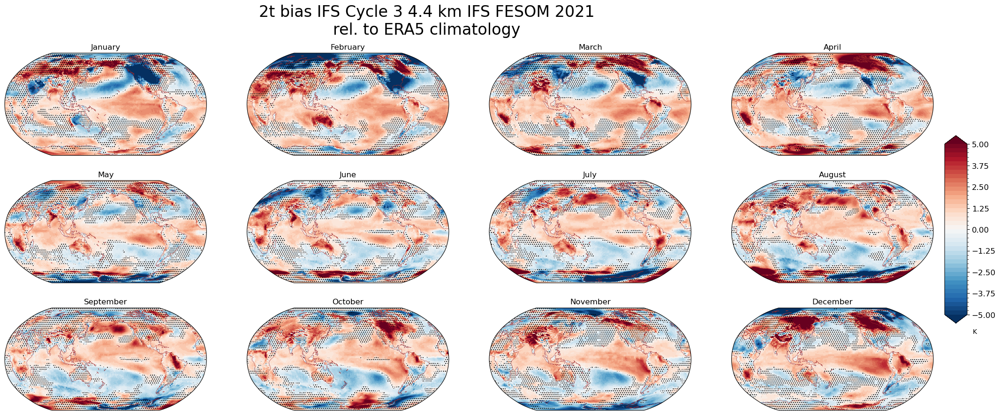

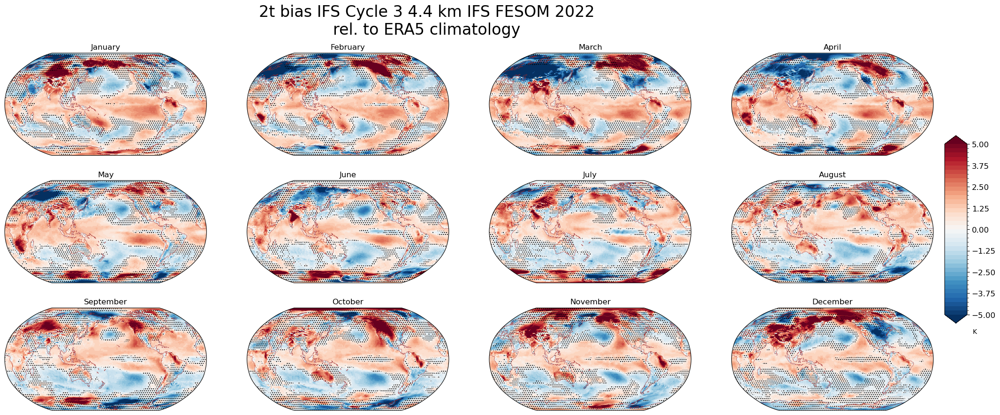

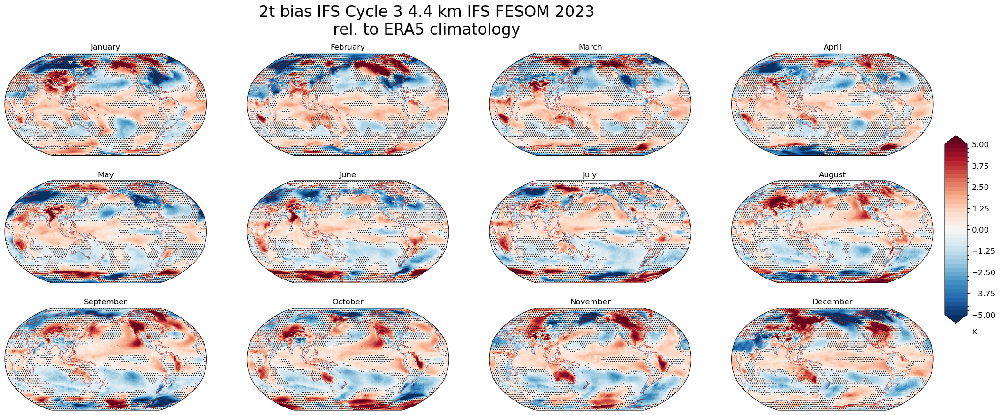

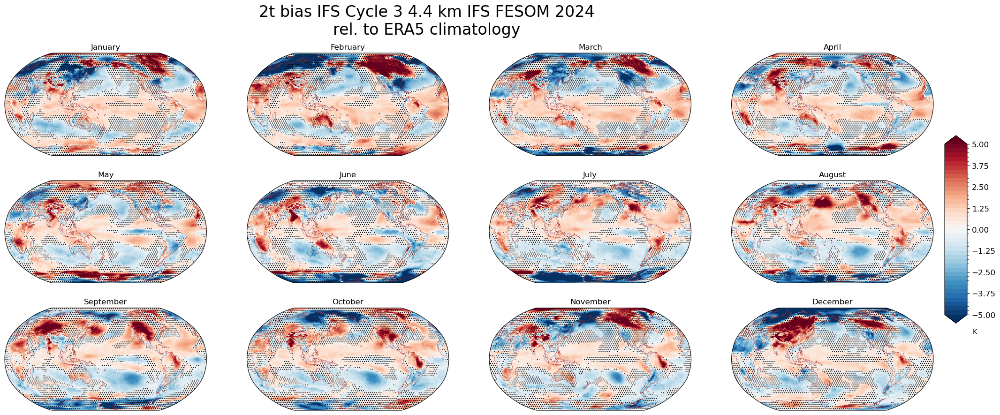

In [19]:
for year in [str(y) for y in range(2020,2025)]:
    plot_maps(model=cdo.remapcon('r360x180',input=ifs_4km_2t.to_dataset(),returnXDataset=True)['2t'],
              ref_data=era5_r360x180_ref_clim,
              var='2t',
              model_label='Cycle 3 4.4 km IFS FESOM',
              year=year) # note that model_label is also used in the filename, so avoid using characters that are not permitted for filenames



In [ ]:
for year in [str(y) for y in range(2020,2025)]:
    plot_maps(model=cdo.remapcon('r360x180',input=ifs_9km_2t.to_dataset(),returnXDataset=True)['2t'],
              ref_data=era5_r360x180_ref_clim,
              var='2t',
              model_label='Cycle 3 9 km IFS NEMO',
              year=year) # note that model_label is also used in the filename, so avoid using characters that are not permitted for filenames



In [ ]:
for year in [str(y) for y in range(2020,2025)]:
    plot_maps(model=cdo.remapcon('r360x180',input=ifs_28km_2t.to_dataset(),returnXDataset=True)['2t'],
              ref_data=era5_r360x180_ref_clim,
              var='2t',
              model_label='Cycle 3 28 km IFS NEMO',
              year=year) # note that model_label is also used in the filename, so avoid using characters that are not permitted for filenames



In [ ]:
for year in [str(y) for y in range(2020,2025)]:
    plot_maps(model=cdo.remapcon('r360x180',input=ifs_28km_f_2t.to_dataset(),returnXDataset=True)['2t'],
              ref_data=era5_r360x180_ref_clim,
              var='2t',
              model_label='Cycle 3 28 km IFS FESOM',
              year=year) # note that model_label is also used in the filename, so avoid using characters that are not permitted for filenames

